In [1]:
import pandas as pd # bibli pour manipuler des données tabulaires (DataFrame) et faire du nettoyage/aggregation de données
import seaborn as sns # bibli de visualisation statistique basée sur Matplotlib, avec des graphiques prêts à l’emploi et esthétiques
import plotly.express as px # interface haut niveau de Plotly pour créer rapidement des graphiques interactifs à partir de DataFrame
import plotly.graph_objects as go # interface orientée objets de Plotly pour construire des figures interactives complexes et très personnalisées
import matplotlib.pyplot as plt #  module principal de Matplotlib pour créer des graphiques 2D classiques (courbes, histogrammes, scatter, etc.)
import numpy as np # bibliothèque de calcul scientifique pour manipuler des tableaux n‑dimensionnels et effectuer des opérations mathématiques rapides
pd.options.mode.chained_assignment = None  # default='warn' # pd.options.mode.chained_assignment = None : désactive les avertissements de pandas lorsqu’on fait des affectations « chaînées » potentiellement ambiguës sur un DataFrame

# Bloc IA : WS 2
## Régression avec `python` ([`scipy`](https://www.scipy.org/), [`scikit-learn`](https://scikit-learn.org/)) 


|Auteur|Centre|Modification|
|---|---|---|
|M. A. BENATIA|Rouen|2024/07/02|

Dépendance : Ce Workshop doit être réalisé après celui sur le Workshop EDA (Exploratory Data Analysis).

Nous allons essayer, dans le cadre de ce workshop, d'entraîner, de configurer et d'utiliser des algorithmes ML afin de résoudre une tâche de régression. Nous tâcherons systématiquement d'en discuter les performances en nous appuyant sur des indicateurs pertinents.

On rappelle que le dataset présente des données immobilières californiennes. Il compte des variables telles que la population, le salaire médian, le prix moyen d'un logement, etc. Et ce pour chaque block group (le block group est la la plus petite division administrative aux Etats-Unis - entre 500 et 5000 personnes).

## Preparation de l'environnement

In [3]:
# compatibilité python 2 et python 3
from __future__ import division, print_function, unicode_literals

# imports
import numpy as np
import os

# stabilité du notebook d'une exécution à l'autre
np.random.seed(42)

# jolies figures directement dans le notebook
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# où sauver les figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "workflowDS"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID) # le dossier doit exister

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# ignorer les warnings inutiles (voir SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

### Reconstruction de l'environnement de fin de la première partie du _Workshop_

On va reconstituer le _kernel_ `python` de la première partie du _Workshop_. Vous pouvez executer le code sans vous soucier de son contenu jusqu'à la partie _Choisir et Entraîner un modèle_.

### Importation et chargement des données

In [11]:
    import os
    import tarfile
    from six.moves import urllib
    import pandas as pd

    DOWNLOAD_ROOT = "https://github.com/ph10r/eiSpeInfoDS/raw/master/"
    HOUSING_PATH = os.path.join("datasets", "housing")
    HOUSING_URL = DOWNLOAD_ROOT + "housing.tgz"

    def fetch_housing_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH):
        if not os.path.isdir(housing_path):
            os.makedirs(housing_path)
        tgz_path = os.path.join(housing_path, "housing.tgz")
        urllib.request.urlretrieve(housing_url, tgz_path)
        housing_tgz = tarfile.open(tgz_path)
        housing_tgz.extractall(path=housing_path)
        housing_tgz.close()

    fetch_housing_data()

    def load_housing_data(housing_path=HOUSING_PATH):
        csv_path = os.path.join(housing_path, "housing.csv")
        return pd.read_csv(csv_path)

    housing = load_housing_data()

C:\Users\hanae\AppData\Local\Temp\ipykernel_13492\3239189383.py:16: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  housing_tgz.extractall(path=housing_path)


### Diviser les données en deux ensemble (Apprentissage et Test) 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

housing["income_cat"] = np.ceil(housing["median_income"]/1.5)
housing["income_cat"].where(housing["income_cat"] < 5, 5.0, inplace=True) # replace where false

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
# test_size=0.2 c'est là où on va donner 80% de jeu de donnée pour l'étude

for train_index, test_index in split.split(housing, housing["income_cat"]):
    strat_train_set = housing.loc[train_index]
    strat_test_set = housing.loc[test_index]

for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)

housing = strat_train_set.copy()

C:\Users\hanae\AppData\Local\Temp\ipykernel_13492\2158265398.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  housing["income_cat"].where(housing["income_cat"] < 5, 5.0, inplace=True) # replace where false


### Mettre le tout dans une Pipeline

In [ ]:
housing_labels = strat_train_set["median_house_value"].copy()
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer

# Indices des colonnes utilisées pour les transformations
rooms_ix, bedrooms_ix, population_ix, household_ix = 3, 4, 5, 6

# Classe pour ajouter des attributs combinés
class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room=True):
        self.add_bedrooms_per_room = add_bedrooms_per_room
    def fit(self, X, y=None):
        return self  # rien d'autre à faire
    def transform(self, X, y=None):
        rooms_per_household = X[:, rooms_ix] / X[:, household_ix]
        population_per_household = X[:, population_ix] / X[:, household_ix]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, bedrooms_ix] / X[:, rooms_ix]
            return np.c_[X, rooms_per_household, population_per_household,
                         bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]

# Pipeline pour les attributs numériques
num_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="median")),
        ('attribs_adder', CombinedAttributesAdder()),
        ('std_scaler', StandardScaler()),
    ])

# Sélection des attributs numériques et catégoriels
housing_num = housing.select_dtypes(include=[np.number]) 
num_attribs = list(housing_num)
cat_attribs = ["ocean_proximity"]

# Pipeline complet pour les attributs numériques et catégoriels
full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("cat", OneHotEncoder(), cat_attribs),
    ])

# Transformation des données
# Compléter par :
housing_prepared = full_pipeline.fit_transform(housing)

# Récupération des noms de colonnes pour le OneHotEncoder
cat_encoder = full_pipeline.named_transformers_["cat"]
cat_one_hot_attribs = list(cat_encoder.get_feature_names_out(cat_attribs))

# Noms des nouvelles colonnes ajoutées par CombinedAttributesAdder
added_attribs = ["rooms_per_household", "population_per_household"]
if CombinedAttributesAdder().add_bedrooms_per_room:
    added_attribs.append("bedrooms_per_room")

# Noms de toutes les colonnes finales
num_attribs += added_attribs
columns = num_attribs + cat_one_hot_attribs

# Conversion du numpy array en DataFrame
# Compléter par :
housing_prepared_df = pd.DataFrame(housing_prepared, columns=columns)

# Introduction à la Régression Linéaire pour Estimer les Prix Médians des Biens Immobiliers

## Pourquoi Utiliser la Régression ?

L'utilisation de la régression pour prédire les prix immobiliers est justifiée pour plusieurs raisons :
1. **Prédictibilité** : La régression linéaire permet des prédictions précises des prix des biens immobiliers basées sur les données historiques disponibles.
2. **Compréhension des Relations** : Elle aide à comprendre l'impact de chaque variable indépendante sur les prix immobiliers, déterminant ainsi quels facteurs influencent le plus les prix.
3. **Simplicité et Efficacité** : La régression linéaire est relativement simple à mettre en œuvre et à interpréter, la rendant accessible même aux non-experts en statistiques.

## Qu'est-ce que la Régression Linéaire ?

La régression linéaire consiste à trouver la meilleure droite (ou hyperplan dans le cas de plusieurs prédicteurs) qui minimise la différence entre les valeurs prédites et observées. Cette droite est définie par l'équation suivante :

$\hat{y} = \theta_0 + \theta_1 x_1 + \theta_2 x_2 + ... + \theta_n x_n$

où $\hat{y}$ est la valeur prédite du prix médian des biens immobiliers, $\theta_0$ est l'ordonnée à l'origine, et $\theta_1, \theta_2, ..., \theta_n$ sont les coefficients des variables indépendantes $x_1, x_2, ..., x_n$.

## La Méthode des Moindres Carrés Ordinaires (OLS)

La méthode des moindres carrés ordinaires (OLS) est la technique la plus couramment utilisée pour estimer les coefficients en régression linéaire. L'objectif de l'OLS est de minimiser la somme des résidus au carré (les différences entre les valeurs observées et prédites). Mathématiquement, cela consiste à résoudre le problème suivant :

$\min_{\theta} \sum_{i=1}^{m} (y_i - \hat{y}_i)^2$

où $y_i$ est la valeur observée, $\hat{y}_i$ est la valeur prédite, et $m$ est le nombre total d'observations.

En utilisant la méthode OLS, nous pouvons obtenir les valeurs optimales des coefficients $\theta$ qui nous permettent de prédire les prix médians des biens immobiliers avec la plus grande précision possible. Cette approche est essentielle pour établir des modèles robustes et fiables dans le domaine immobilier.


# Approche OLS 1 : Utilisation de la Solution de l'Équation Normale

Nous pouvons modéliser l'équation de régression linéaire multiple en utilisant la multiplication matricielle :

$\hat{Y} = X \theta$

L'optimum $\hat{\theta}$ qui minimise l'erreur quadratique moyenne (MSE) résout également l'équation normale :

$(X^T X) \hat{\theta} = X^T Y$

Si $X$ a un rang de colonne complet, alors il existe une solution unique à $\hat{\theta}$ :

$\hat{\theta} = (X^T X)^{-1} X^T Y$

Notez que cette dérivation est l'une des plus difficiles, car elle nécessite en particulier des notions d'algèbre linéaire telles que: le calcul matriciel, l'inverse d'une matrice, dérivé d'une équation matricielle.

## Implémentation en Code

Essayons cela en code. Nous ajouterons un terme de biais pour représenter effectivement l'équation linéaire que nous avons proposée (avec intercept), ainsi que pour que nos résidus s'annulent.

### Sélection des caractéristiques (Variable(s) Indépendante(s))

In [14]:
X = housing_prepared_df[["total_rooms", "median_income"]]
X["bias"] = 1
X.head(5)

,total_rooms,median_income,bias
0,0.584777,-0.893647,1
1,1.261467,1.292168,1
2,-0.469773,-0.525434,1
3,-0.348652,-0.865929,1
4,0.427179,0.325752,1


 ### Choix de la variable cible (Variable Dépentandante)

In [15]:
# La valeur cible est le prix médian
y = housing_prepared_df["median_house_value"]

### Calcul des paramètres de régression

In [16]:
theta_using_normal_equation = np.linalg.inv(X.T @ X) @ X.T @ y

### Calcul des prédiction du prix médian

Nous allons sauvegarder aussi les prédiction afin de conduire une étude comparative entre la méthode des moindres carrées et les modèles proposés par les différentes librairies python (StatModel et SickitLearn)

In [17]:
housing_prepared_df["pred_median_house_value"] = X.to_numpy() @ theta_using_normal_equation

### Affichage des résultats


In [18]:
housing_prepared_df[["median_house_value", "pred_median_house_value"]].head()

,median_house_value,pred_median_house_value
0,-1.166015,-0.615965
1,0.627451,0.885426
2,-1.074397,-0.360147
3,-0.816829,-0.594588
4,0.270486,0.222942


Comment peut-on Calculer l'erreur d'estimation sur ces prédiction?

**il y a des moins, pourquoi il y en a ? c'est à cause de la normalisation et aussi ça va nous permettre de voir les écarts préditent**

# Utilisation de la librarie StatModel 

statsmodels est une bibliothèque en Python qui fournit des classes et des fonctions pour l'estimation de nombreux modèles statistiques, y compris les modèles de régression linéaire.

## Importation des librairies et définition des variables indépendantes et dépendantes 

In [ ]:
import statsmodels.api as sm

# Définition des variables indépendantes (X) et de la variable dépendante (y)
X = housing_prepared_df.drop("median_house_value", axis=1)
y = housing_prepared_df["median_house_value"]
# print(X)

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0      -0.941350  1.347438            0.027564     0.584777        0.640371   
1       1.171782 -1.192440           -1.722018     1.261467        0.781561   
2       0.267581 -0.125972            1.220460    -0.469773       -0.545138   
3       1.221738 -1.351474           -0.370069    -0.348652       -0.036367   
4       0.437431 -0.635818           -0.131489     0.427179        0.272790   
...          ...       ...                 ...          ...             ...   
16507   1.251711 -1.220505           -1.165333     1.890456        1.696862   
16508  -0.921368  1.342761           -1.085806     2.468471        2.161816   
16509  -1.570794  1.310018            1.538566    -0.895802       -0.895679   
16510  -1.560803  1.249211           -1.165333     0.249005        0.112126   
16511  -1.281050  2.025674           -0.131489    -0.721836       -0.759358   

       population  households  median_income  rooms

### Ajout d'une constante (intercept) au modèle

In [ ]:
X = sm.add_constant(X)

       const  longitude  latitude  housing_median_age  total_rooms  \
0        1.0  -0.941350  1.347438            0.027564     0.584777   
1        1.0   1.171782 -1.192440           -1.722018     1.261467   
2        1.0   0.267581 -0.125972            1.220460    -0.469773   
3        1.0   1.221738 -1.351474           -0.370069    -0.348652   
4        1.0   0.437431 -0.635818           -0.131489     0.427179   
...      ...        ...       ...                 ...          ...   
16507    1.0   1.251711 -1.220505           -1.165333     1.890456   
16508    1.0  -0.921368  1.342761           -1.085806     2.468471   
16509    1.0  -1.570794  1.310018            1.538566    -0.895802   
16510    1.0  -1.560803  1.249211           -1.165333     0.249005   
16511    1.0  -1.281050  2.025674           -0.131489    -0.721836   

       total_bedrooms  population  households  median_income  \
0            0.640371    0.732602    0.556286      -0.893647   
1            0.781561    0.5336

### Ajustement du modèle de régression multiple

In [25]:
model = sm.OLS(y, X).fit()

### Affichage du résumé du modèle


In [26]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     median_house_value   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     2026.
Date:                Mon, 08 Dec 2025   Prob (F-statistic):               0.00
Time:                        10:13:42   Log-Likelihood:                -14806.
No. Observations:               16512   AIC:                         2.964e+04
Df Residuals:                   16496   BIC:                         2.977e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

#### Question 1 : Comment interpréter les coefficients des variables indépendantes ?

#### Answer
Les coef des variables indépendantes aussi appelés paramètres sont essentiels pour comprendre l'impact de chaque variable sur la variable dépendante dans le modèle.

1. Interprétation du p-value :
- Un p-value faible (généralement inférieur à 0,05) indique que la variable indépendante est statistiquement significative, c-à-d qu'il y a une forte preuve que la variable a un effet sur la variable dépendante.
- Une p-value élevé indique que la variable indépendante n'est pas statistiquement significative et que son effet pourait être dû au hasard.

2. Exemple Prartique :
Suppossons que le p-value pour housing_median_age est 0,02. Cela signifie qu'il y a seulement 2% de chance que l'effet observé de housing_median_age sur housing_median_value soit dû au hasard. Par conséquent, housing_median_age sur variable significative dans le modèle.

3. Utilisation dans l'évaluation du modèle



#### Question 2 : Que signifie le p-value associé à chaque coefficient, et comment l'utiliser pour évaluer la signification statistique des variables ?

#### Solution




## Utilisation de la librairie SK-Learn

Nous allons utiliser SKLearn pour étendre notre modèle de régression linéaire simple à un modèle de régression linéaire multiple (utilisant plusieurs caractéristiques en entrée). Une autre approche pour optimiser notre modèle consiste à utiliser la classe sklearn.linear_model.LinearRegression. (Documentation)

### Importation des librairies

In [27]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

### Définition des variables indépendantes (X) et de la variable dépendante (y)


In [58]:
# x prend tout
X = housing_prepared_df.drop("median_house_value", axis=1)
# C'est le y qu'on veut prédire
y = housing_prepared_df["median_house_value"]

1. **Création de l'objet SKLearn**

In [29]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


### Rappel de la Fonction MSE

La MSE (Mean Squared Error), ou erreur quadratique moyenne, est une métrique couramment utilisée pour évaluer les performances des modèles de régression. Elle se définit par la formule suivante :

$\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 $

où :
- $n$ est le nombre total d'observations,
- $y_i$ est la valeur réelle de la $i$-ème observation,
- $\hat{y}_i$ est la valeur prédite pour la $i$-ème observation.

#### Pourquoi Utilise-t-on la MSE ?

La MSE est utilisée car elle pénalise fortement les grandes erreurs en élevant les résidus au carré, ce qui signifie qu'elle est très sensible aux outliers. Cela permet d'obtenir une mesure globale de la précision des prédictions du modèle.

#### Avantages de la MSE :

1. **Simplicité et Compréhension** : La MSE est facile à comprendre et à calculer.
2. **Différentiabilité** : La fonction de perte MSE est différentiable, ce qui est utile pour les techniques d'optimisation basées sur le gradient, telles que la descente de gradient.
3. **Sensibilité aux Grandes Erreurs** : En élevant les erreurs au carré, la MSE pénalise fortement les grandes erreurs, ce qui incite à minimiser les prédictions éloignées des valeurs réelles.

#### Inconvénients de la MSE :

1. **Sensibilité aux Outliers** : La MSE peut être disproportionnellement influencée par des valeurs aberrantes (outliers), ce qui peut biaiser l'évaluation des performances du modèle.
2. **Interprétation** : L'interprétation de la MSE n'est pas aussi directe que celle de la MAE (Mean Absolute Error), car elle est exprimée en unités carrées des valeurs à prédire.
3. **Non-Robustesse** : La MSE n'est pas robuste face aux erreurs systématiques et peut ne pas refléter correctement la performance du modèle sur des distributions de données non symétriques.

En conclusion, la MSE est un outil puissant pour évaluer les modèles de régression, mais il est important de comprendre ses limitations et d'utiliser des métriques complémentaires si nécessaire.


2. **Ajuster l'objet sklearn aux données**

Ensuite, nous "ajustons" le modèle, ce qui signifie calculer les paramètres qui minimisent la fonction de perte. La classe `LinearRegression` est codée en dur pour utiliser la MSE comme fonction de perte. Le premier argument de la fonction `fit` doit être une matrice (ou DataFrame), et le second doit être les observations que nous essayons de prédire.


In [30]:
model.fit(X, y)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


3. **Analyser l'ajustement ou appeler la prédiction**

Maintenant que notre modèle est entraîné, nous pouvons lui poser des questions. Le code ci-dessous demande au modèle d'estimer la valeur médiane d'une maison pour un ensemble donné d'attributs de logement.

In [32]:
# Compléter par :
X["sklearn_preds"] = model.predict(X)

In [33]:
X.head(15)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_household,population_per_household,bedrooms_per_room,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,pred_median_house_value,sklearn_preds
0,-0.941350,1.347438,0.027564,0.584777,0.640371,0.732602,0.556286,-0.893647,0.017395,0.006223,-0.121122,0.0,1.0,0.0,0.0,0.0,-0.615965,-1.048831
1,1.171782,-1.192440,-1.722018,1.261467,0.781561,0.533612,0.721318,1.292168,0.569256,-0.040811,-0.810867,0.0,0.0,0.0,0.0,1.0,0.885426,0.851246
2,0.267581,-0.125972,1.220460,-0.469773,-0.545138,-0.674675,-0.524407,-0.525434,-0.018024,-0.075371,-0.338273,0.0,1.0,0.0,0.0,0.0,-0.360147,-0.474934
3,1.221738,-1.351474,-0.370069,-0.348652,-0.036367,-0.467617,-0.037297,-0.865929,-0.595140,-0.106803,0.961205,0.0,0.0,0.0,0.0,1.0,-0.594588,-0.180726
4,0.437431,-0.635818,-0.131489,0.427179,0.272790,0.374060,0.220898,0.325752,0.251241,0.006109,-0.474513,1.0,0.0,0.0,0.0,0.0,0.222942,0.324512
5,-1.231094,1.085499,-0.051963,-0.661977,-0.686328,-0.623583,-0.652174,-0.094224,-0.249165,-0.019289,-0.075233,0.0,0.0,0.0,1.0,0.0,-0.063150,-0.005384
6,-1.226099,0.790817,-0.449595,0.747520,0.333648,0.324761,0.383269,1.895358,0.438279,-0.027316,-0.837607,1.0,0.0,0.0,0.0,0.0,1.301483,1.464304
7,0.632259,-0.673238,0.584248,-0.435167,-0.659551,-0.575180,-0.582967,0.635536,0.247328,-0.025716,-0.891626,1.0,0.0,0.0,0.0,0.0,0.438104,0.514828
8,-1.186134,0.762752,-0.926753,-0.604456,-0.640076,-0.906831,-0.636203,-1.133296,-0.109268,-0.130785,-0.152101,1.0,0.0,0.0,0.0,0.0,-0.777808,-0.484050
9,0.647246,-0.757433,0.027564,-0.985591,-0.742317,1.138651,-0.745337,-1.772289,-1.174420,0.802785,3.534666,1.0,0.0,0.0,0.0,0.0,-1.216264,-1.528861


4. **Analyser les paramètres.**

Nous pouvons interroger le modèle pour obtenir son intercept et ses coefficients de pente avec les attributs _intercept et _coef, respectivement.

In [45]:
# Compléter par :
print("les attributs intercept :", model.intercept_)

# 0.25861115049987465

les attributs intercept : 0.2586111504998823


à quoi correspond le résultats?

In [46]:
# Compléter par :
print("Ordonnée à l'origine :", model.coef_)

# array([-0.48099132, -0.49017009,  0.11871204, -0.01604609,  0.06346906,
    #    -0.3950748 ,  0.39286197,  0.43842805,  0.05708479,  0.00901534,
    #     0.07993511, -0.15571592, -0.47723218,  0.95384573, -0.19433957,
    #    -0.12655805,  0.30152361])

Ordonnée à l'origine : [-0.48099132 -0.49017009  0.11871204 -0.01604609  0.06346906 -0.3950748
  0.39286197  0.43842805  0.05708479  0.00901534  0.07993511 -0.15571592
 -0.47723218  0.95384573 -0.19433957 -0.12655805  0.30152361]


Que signifie les valeurs dans le tableau? Comment pourrait-on les intérpréter

**Les valeurs du tableau sont les coefficients**

5. **Visualiser l'ajustement**

Nous pouvons visualiser ces données en trois dimensions, mais pour de nombreux problèmes du monde réel, cela ne sera pas possible (ou utile).

In [53]:
import plotly.express as px
import plotly.graph_objects as go

X["median_house_value"] = y
# Create the 3D scatter plot with actual values
fig = px.scatter_3d(X, x="median_income", y="total_bedrooms", z="median_house_value", 
                    title="Actual vs Predicted Housing Prices",
                    labels={'median_income': 'Median Income', 'total_bedrooms': 'Total Bedrooms', 'median_house_value': 'Median House Value'},
                    opacity=0.7)

# Add the predicted values to the plot
fig.add_trace(go.Scatter3d(x=X["median_income"], y=X["total_bedrooms"], z=X["sklearn_preds"],
                           mode='markers', marker=dict(size=5, color='red', symbol='circle'),
                           name='Predicted Values'))

fig.update_layout(autosize=False, width=800, height=600)

fig.show()

6. **Analyse performance**

In [54]:
mse = mean_squared_error(y, X["sklearn_preds"])
r2 = r2_score(y, X["sklearn_preds"])

print("Mean Squared Error (MSE):", mse) # Mean Squared Error (MSE): 0.3518446365545647
print("R-squared (R2):", r2) # R-squared (R2): 0.6481553634454353

Mean Squared Error (MSE): 0.3518446365545647
R-squared (R2): 0.6481553634454353


#### Un modèle plus puissant

Nous allons donc essayer un modèle plus puissant : un [_arbre de décision_](https://fr.wikipedia.org/wiki/Arbre_de_d%C3%A9cision_(apprentissage)) implémenté dans `scikit-learn` par [`DecisionTreeRegressor`](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html). A vous de créer est d'entraîner ce modèle. Pensez à initialiser la graine aléatoire du modèle (à $42$, bien évidemment) _via_ le paramètre `random_state` de son constructeur.

In [65]:
from sklearn.tree import DecisionTreeRegressor 
# Compléter par :
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X, y)

,criterion,'squared_error'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,ccp_alpha,0.0


Notre modèle est entraîné : on peut l'évaluer (toujours sur le traîning set, bien évidemment) et calculer l'erreur-type.

In [72]:
housing_predictions = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_labels, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

c:\Users\hanae\algo_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



np.float64(237143.63505996382)

Avons-nous bien lu !? Pas d'erreur ? Le modèle parfait ?

Il est bien plus probable que nous soyons en situation de [_sur-apprentissage_](https://fr.wikipedia.org/wiki/Surapprentissage) (ou _over-fitting_), le modèle, trop puissant, a pu se contenter d'apprendre _par coeur_ toutes nos données d'entraînement. Il est peu vraissemblale que cette stratégie _généralise_ sur des données nouvelles.

On pourrait prouver cette théorie avec le jeu de test mais l'on s'est interdit de l'utiliser avant d'avoir la conviction que notre modèle était performant... Alors que faire ?

Nous allons utiliser une partie du jeu d'entraînement pour entraîner à proprement dit, et une autre pour valider les modèles : c'est ce que l'on appelle la [_validation croisée_](https://fr.wikipedia.org/wiki/Validation_crois%C3%A9e) (ou _cross-validation_).

#### Validation croisée

On pourrait utiliser à nouveau `train_test_split` mais `scikit-learn` propose une [fonctionalité](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html#sklearn.model_selection.cross_val_score) de $k$-_fold cross validation_. Ce qui consiste à :

- diviser aléatoirement le jeu d'entraînement en $k$ sous-jeux,
- pour chacun des sous-jeux, tour à tour désignés _sous-jeu de validation_:
    * entraîner le modèle sur les $k-1$ autres sous-jeux
    * évaluer le modèle sur le sous-jeu de validation

On obtient un _array_ de $k$ scores.

In [73]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(tree_reg, housing_prepared, housing_labels,
                         scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-scores)

> **Remarque** : `scikit-learn` attend non pas une mesure d'erreur pour la cross-validation mais une mesure de performance (le plus étant le mieux). Il est naturel d'utiliser l'opposé de la _MSE_.

In [74]:
def display_scores(scores):
    # à compléter
    print("Scores",scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std()) 
display_scores(tree_rmse_scores)

Scores [ 96.39381492  86.46263311  90.52642329 208.51788862 201.8464148
 111.75598581 111.86432901 104.15359296  76.65003024  93.90898593]
Mean: 118.20800986679637
Standard deviation: 44.719191665791165


Voilà qui est moins impressionant que le score parfait de tout à l'heure.

On constate que l'erreur-type est de 71 mille dollars, soit supérieure à celle du modèle linéaire. L'_overfitting_ que nous suspections est avéré : ce modèle généralise mal.

> **Remarque** : La _cross-validation_ nous permet d'estimer la précision d'une estimation _via_ l'écart type. C'est une mesure précieuse mais chère : elle nécessite un nombre conséquent d'entraînement du modèle, ce qui n'est pas possible dans tous les contextes.

### Démonstration Bonus
Plus tard dans le bloc suivant, nous apprendrons d'autres modèles. Cependant, vous en savez déjà assez pour commencer à utiliser d'autres techniques :

Dans cette démonstration bonus, nous allons explorer plusieurs modèles de régression en utilisant différentes techniques de machine learning. En plus de la régression linéaire que nous avons déjà abordée, nous allons utiliser les modèles suivants :

- **Arbre de Décision (Decision Tree Regressor)**
- **Support Vector Machine (SVM)**
- **K-Nearest Neighbors (KNN)**
- **Naive Bayes**

Nous allons ajuster ces modèles aux données de logement et comparer leurs performances en termes d'erreur quadratique moyenne (MSE).

In [77]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LinearRegression

# Assuming `housing` is your DataFrame containing the dataset

# Define the pre-processing pipeline
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler()), # pour normaliser les données
])

num_attribs = list(housing.select_dtypes(include=[np.number]))
cat_attribs = ["ocean_proximity"]

full_pipeline = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", OneHotEncoder(), cat_attribs),
])

housing_prepared = full_pipeline.fit_transform(housing)
housing_labels = housing["median_house_value"]

# Create a DataFrame from the prepared data
housing_prepared_df = pd.DataFrame(housing_prepared, columns=num_attribs + full_pipeline.named_transformers_['cat'].get_feature_names_out().tolist())

# Split data into features and target
X = housing_prepared_df
y = housing_labels

# Initialize and train models
models = {
    "DecisionTreeRegressor": DecisionTreeRegressor(),
    "LinearRegression": LinearRegression(),
    "SVR": SVR(),
    "KNeighborsRegressor": KNeighborsRegressor(),
    "NaiveBayes": GaussianNB()
}

# Store predictions and errors
predictions = {}
errors = {}

# Fit the models and calculate mean squared error
for name, model in models.items():
    model.fit(X, y)
    # Compléter par :
    preds = model.predict(X)
    predictions[name] = preds
    errors[name] = mean_squared_error(y, preds)

# Convert errors to DataFrame for easier comparison
errors_df = pd.DataFrame.from_dict(errors, orient='index', columns=['MSE'])
print(errors_df)

# Add predictions to the original DataFrame for visualization
housing_prepared_df["median_house_value"] = housing_labels
housing_prepared_df["DecisionTree_preds"] = predictions["DecisionTreeRegressor"]
housing_prepared_df["LinearRegression_preds"] = predictions["LinearRegression"]
housing_prepared_df["SVR_preds"] = predictions["SVR"]
housing_prepared_df["KNN_preds"] = predictions["KNeighborsRegressor"]
housing_prepared_df["NaiveBayes_preds"] = predictions["NaiveBayes"]

# Visualization: Median Income vs. Median House Value
fig_income = px.scatter_3d(housing_prepared_df, x="median_income", y="total_bedrooms", z="median_house_value", 
                           title="Actual vs Predicted Housing Prices (Median Income)",
                           labels={'median_income': 'Median Income', 'total_bedrooms': 'Total Bedrooms', 'median_house_value': 'Median House Value'},
                           opacity=0.7)

# Add the predicted values to the plot
fig_income.add_trace(go.Scatter3d(x=housing_prepared_df["median_income"], y=housing_prepared_df["total_bedrooms"], z=housing_prepared_df["DecisionTree_preds"],
                                   mode='markers', marker=dict(size=5, color='red', symbol='circle'), name='DecisionTree Predicted Values'))

fig_income.add_trace(go.Scatter3d(x=housing_prepared_df["median_income"], y=housing_prepared_df["total_bedrooms"], z=housing_prepared_df["LinearRegression_preds"],
                                   mode='markers', marker=dict(size=5, color='blue', symbol='circle'), name='LinearRegression Predicted Values'))

fig_income.add_trace(go.Scatter3d(x=housing_prepared_df["median_income"], y=housing_prepared_df["total_bedrooms"], z=housing_prepared_df["SVR_preds"],
                                   mode='markers', marker=dict(size=5, color='green', symbol='circle'), name='SVR Predicted Values'))

fig_income.add_trace(go.Scatter3d(x=housing_prepared_df["median_income"], y=housing_prepared_df["total_bedrooms"], z=housing_prepared_df["KNN_preds"],
                                   mode='markers', marker=dict(size=5, color='purple', symbol='circle'), name='KNN Predicted Values'))

fig_income.add_trace(go.Scatter3d(x=housing_prepared_df["median_income"], y=housing_prepared_df["total_bedrooms"], z=housing_prepared_df["NaiveBayes_preds"],
                                   mode='markers', marker=dict(size=5, color='orange', symbol='circle'), name='NaiveBayes Predicted Values'))

fig_income.update_layout(autosize=False, width=800, height=600)

fig_income.show()

# Visualization: Total Bedrooms vs. Median House Value
fig_bedrooms = px.scatter_3d(housing_prepared_df, x="total_bedrooms", y="median_income", z="median_house_value", 
                             title="Actual vs Predicted Housing Prices (Total Bedrooms)",
                             labels={'total_bedrooms': 'Total Bedrooms', 'median_income': 'Median Income', 'median_house_value': 'Median House Value'},
                             opacity=0.7)

# Add the predicted values to the plot
fig_bedrooms.add_trace(go.Scatter3d(x=housing_prepared_df["total_bedrooms"], y=housing_prepared_df["median_income"], z=housing_prepared_df["DecisionTree_preds"],
                                    mode='markers', marker=dict(size=5, color='red', symbol='circle'), name='DecisionTree Predicted Values'))

fig_bedrooms.add_trace(go.Scatter3d(x=housing_prepared_df["total_bedrooms"], y=housing_prepared_df["median_income"], z=housing_prepared_df["LinearRegression_preds"],
                                    mode='markers', marker=dict(size=5, color='blue', symbol='circle'), name='LinearRegression Predicted Values'))

fig_bedrooms.add_trace(go.Scatter3d(x=housing_prepared_df["total_bedrooms"], y=housing_prepared_df["median_income"], z=housing_prepared_df["SVR_preds"],
                                    mode='markers', marker=dict(size=5, color='green', symbol='circle'), name='SVR Predicted Values'))

fig_bedrooms.add_trace(go.Scatter3d(x=housing_prepared_df["total_bedrooms"], y=housing_prepared_df["median_income"], z=housing_prepared_df["KNN_preds"],
                                    mode='markers', marker=dict(size=5, color='purple', symbol='circle'), name='KNN Predicted Values'))

fig_bedrooms.add_trace(go.Scatter3d(x=housing_prepared_df["total_bedrooms"], y=housing_prepared_df["median_income"], z=housing_prepared_df["NaiveBayes_preds"],
                                    mode='markers', marker=dict(size=5, color='orange', symbol='circle'), name='NaiveBayes Predicted Values'))

fig_bedrooms.update_layout(autosize=False, width=800, height=600)

fig_bedrooms.show()


                                MSE
DecisionTreeRegressor  0.000000e+00
LinearRegression       3.230085e-20
SVR                    1.396008e+10
KNeighborsRegressor    2.140320e+08
NaiveBayes             3.633721e-03


## Comparaison des Modèles de Régression pour Prédire les Prix des Logements

### Description

Dans cette section, nous comparons les performances de différents modèles de régression pour prédire les prix des logements en utilisant le dataset préparé. Nous utilisons les modèles suivants : Arbre de Décision, Support Vector Machine (SVM), K-Nearest Neighbors (KNN) et Naive Bayes. Les performances des modèles sont évaluées à l'aide de l'erreur quadratique moyenne (MSE) et visualisées à travers plusieurs graphiques pour mieux comprendre leurs résultats et leurs erreurs.


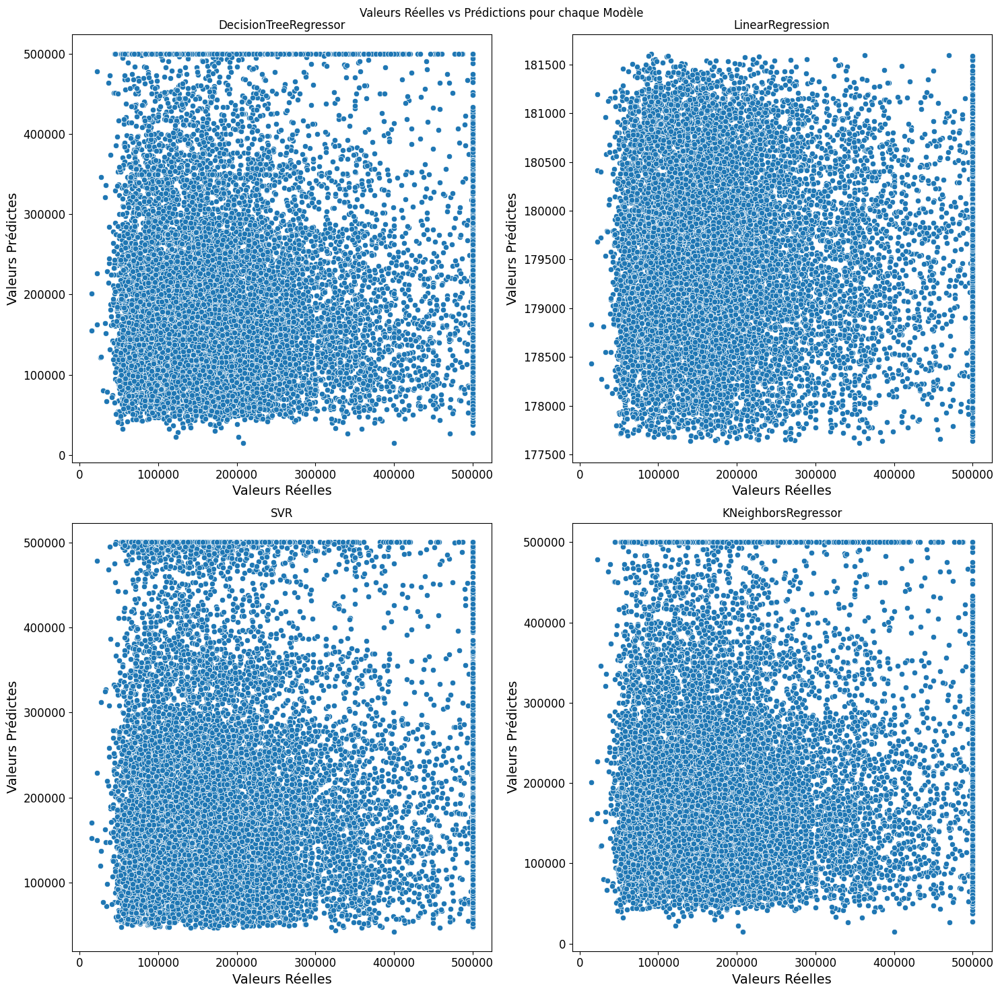

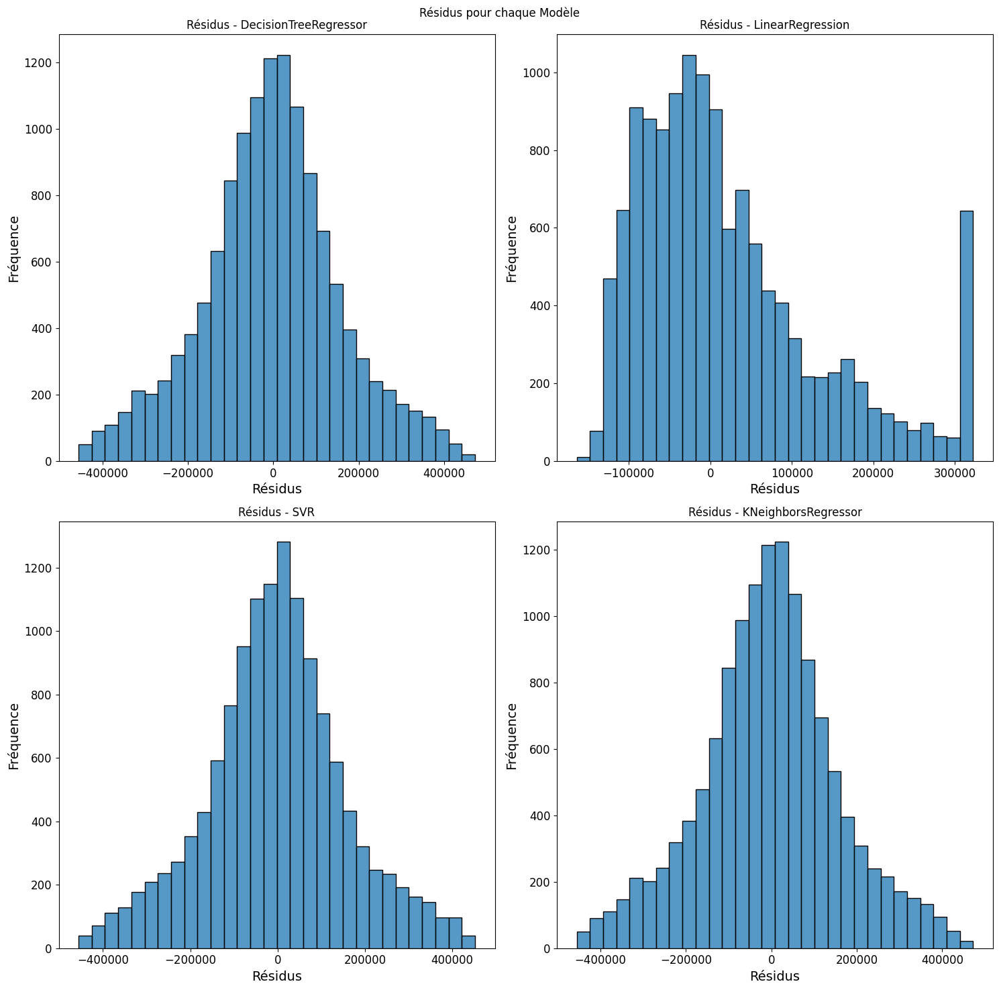

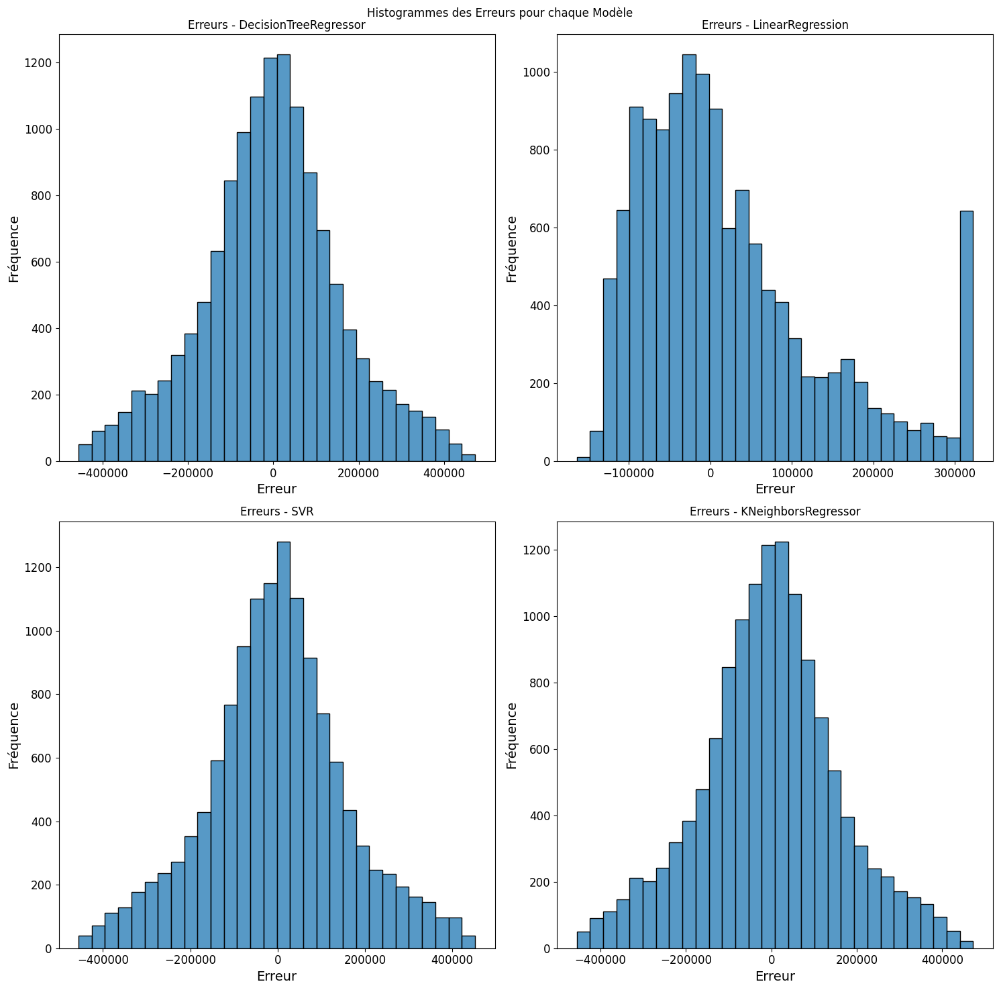

In [78]:
# Graphiques de Dispersion
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle("Valeurs Réelles vs Prédictions pour chaque Modèle")

models_predictions = [housing_prepared_df["DecisionTree_preds"], housing_prepared_df["SVR_preds"],
                      housing_prepared_df["KNN_preds"], housing_prepared_df["NaiveBayes_preds"]]

for ax, preds, model in zip(axs.flatten(), models_predictions, models):
    sns.scatterplot(x=housing_prepared_df["median_house_value"], y=preds, ax=ax)
    ax.set_title(model)
    ax.set_xlabel("Valeurs Réelles")
    ax.set_ylabel("Valeurs Prédictes")

plt.tight_layout()
plt.show()

# Courbes de Résidus
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle("Résidus pour chaque Modèle")

for ax, preds, model in zip(axs.flatten(), models_predictions, models):
    residuals = housing_prepared_df["median_house_value"] - preds
    sns.histplot(residuals, bins=30, ax=ax)
    ax.set_title(f"Résidus - {model}")
    ax.set_xlabel("Résidus")
    ax.set_ylabel("Fréquence")

plt.tight_layout()
plt.show()

# Graphiques 3D pour le Revenu Médian
fig = px.scatter_3d(housing_prepared_df, x="median_income", y="total_bedrooms", z="median_house_value", 
                    color="median_house_value", title="Valeurs Réelles des Prix des Logements")
fig.show()

for model, preds in zip(models, models_predictions):
    fig = px.scatter_3d(housing_prepared_df, x="median_income", y="total_bedrooms", z=preds, 
                        color=preds, title=f"Prédictions des Prix des Logements - {model}")
    fig.show()

# Graphiques 3D pour le Nombre Total de Chambres
fig = px.scatter_3d(housing_prepared_df, x="total_bedrooms", y="median_income", z="median_house_value", 
                    color="median_house_value", title="Valeurs Réelles des Prix des Logements")
fig.show()

for model, preds in zip(models, models_predictions):
    fig = px.scatter_3d(housing_prepared_df, x="total_bedrooms", y="median_income", z=preds, 
                        color=preds, title=f"Prédictions des Prix des Logements - {model}")
    fig.show()

# Histogrammes des Erreurs
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle("Histogrammes des Erreurs pour chaque Modèle")

for ax, preds, model in zip(axs.flatten(), models_predictions, models):
    errors = housing_prepared_df["median_house_value"] - preds
    sns.histplot(errors, bins=30, ax=ax)
    ax.set_title(f"Erreurs - {model}")
    ax.set_xlabel("Erreur")
    ax.set_ylabel("Fréquence")

plt.tight_layout()
plt.show()


## Calcul des Erreurs Quadratiques Moyennes (MSE)
Nous avons calculé les erreurs quadratiques moyennes (MSE) pour chaque modèle afin d'évaluer leurs performances respectives. Remplir le tableau ci-dessous des MSE pour chaque modèle :

| Modèle             | MSE        |
|--------------------|------------|
| Arbre de Décision  | ...        |
| SVM                | ...        |
| KNN                | ...        |
| Naive Bayes        | ...        |

## Visualisation des Performances des Modèles
### Graphiques de Dispersion
Nous avons également créé des graphiques de dispersion pour visualiser les prédictions des différents modèles par rapport aux valeurs réelles des prix des logements. Cela nous permet de mieux comprendre comment chaque modèle se comporte et où se situent leurs erreurs.

## Questions d'Interprétation et de Discussion
1. **Comparaison des MSE :**
   - Quel modèle a la plus petite erreur quadratique moyenne (MSE) ? Que pouvez-vous en déduire sur la performance de ce modèle par rapport aux autres ?
   - Y a-t-il une différence significative entre les MSE des différents modèles ? Si oui, laquelle et pourquoi pensez-vous que cela pourrait être le cas ?

2. **Analyse des Graphiques de Dispersion :**
   - En observant les graphiques de dispersion, pouvez-vous identifier des modèles qui semblent mieux s'ajuster aux données réelles ? Quels indicateurs visuels utilisez-vous pour tirer cette conclusion ?
   - Y a-t-il des tendances ou des motifs récurrents dans les erreurs de prédiction des différents modèles (par exemple, les modèles ont-ils tendance à sous-estimer ou surestimer les prix des logements) ? Comment pourriez-vous expliquer ces tendances ?


**Réponses**